In [4]:
import time

import numpy as np
import matplotlib.pyplot as plt

import torch
from torch.utils.data import DataLoader

import datetime
import h5py

import obspy
from obspy.signal.rotate import rotate_ne_rt
from obspy.clients.fdsn import Client as FDSN_Client
from obspy.geodetics import base
from obspy.taup import TauPyModel

import pyproj
import pandas as pd

from tqdm.notebook import tqdm

import data as udata

%load_ext autoreload
%autoreload 2

In [6]:
import sys
import os
#there has to be a better way 
sys.path.insert(0, os.path.abspath("/home/gende/DAS-Unsupervised-Noise-Filtering"))
import data as udata
from Code.utilities import DAS 

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
auspass = FDSN_Client('http://auspass.edu.au:8080', user='2B', password='carrot22')
inv = auspass.get_stations(network="2B", level='response')
model = TauPyModel(model="iasp91")

locations = {}
for station in inv[0]:
    locations[station.code] = (station.latitude, station.longitude)

station_pairs = []
for i, station in enumerate(inv[0]):
    if station.code in ['SIS01', 'SIS05']:
        continue
    for j in range(i+1, len(inv[0])):
        d = base.gps2dist_azimuth(inv[0][i].latitude, inv[0][i].longitude, 
                                  inv[0][j].latitude, inv[0][j].longitude)[0]
        if d <= 150:
            print('Distance between {} and {}: {:.4f} meters'.format(inv[0][i].code, inv[0][j].code, d))
            station_pairs.append((inv[0][i].code, inv[0][j].code))

Distance between SIS02 and SIS11: 97.9857 meters
Distance between SIS03 and SIS14: 68.2820 meters
Distance between SIS03 and SIS18: 99.7533 meters
Distance between SIS11 and SIS12: 115.2334 meters
Distance between SIS12 and SIS13: 94.2957 meters
Distance between SIS13 and SIS21: 106.6069 meters
Distance between SIS14 and SIS15: 119.8736 meters
Distance between SIS15 and SIS16: 103.3428 meters
Distance between SIS16 and SIS17: 128.1478 meters
Distance between SIS17 and SIS23: 101.7078 meters
Distance between SIS18 and SIS19: 98.3049 meters
Distance between SIS19 and SIS20: 109.1996 meters
Distance between SIS19 and SIS22: 128.0512 meters
Distance between SIS20 and SIS21: 145.5598 meters
Distance between SIS20 and SIS22: 73.4501 meters
Distance between SIS23 and SIS24: 101.6557 meters
Distance between SIS25 and SIS26: 105.3990 meters
Distance between SIS26 and SIS27: 93.2289 meters
Distance between SIS28 and SIS29: 109.4039 meters


# Seismogram Data - October

In [9]:
df = pd.read_csv('./../Data/synthetic-DAS/earthquakes_oct2023.csv')
df = df[df['evaluationstatus'] == 'confirmed']
df = df[4:]
df = df[df['publicid'] != '2023p767004']
df = df[:-7]

for idx, row in df.iterrows():
    origin_time_str = row['origintime']
    origin_datetime = datetime.datetime.strptime(origin_time_str, '%Y-%m-%dT%H:%M:%S.%fZ')
    origin_latitude = row['latitude']
    origin_longitude = row['longitude']
    
    # calculate distance

    # estimate locations
    HAAST_lat = -43.86078
    HAAST_lon = 169.04276

    geodesic = pyproj.Geod(ellps='WGS84')
    fwd_azimuth, back_azimuth, distance_in_m = geodesic.inv(HAAST_lon, HAAST_lat, origin_longitude, origin_latitude)
    
    print(row['publicid'])
    print('EQ Magnitude: '+ str(row['magnitude']))
    print('Origin time: ' + origin_datetime.isoformat())
    print('Distance: '+ str(distance_in_m/1000))
    print()

2023p831660
EQ Magnitude: 2.446822313
Origin time: 2023-11-04T17:08:37.415000
Distance: 95.95426739105386

2023p831248
EQ Magnitude: 2.232072102
Origin time: 2023-11-04T13:29:15.942000
Distance: 268.065066807366

2023p829440
EQ Magnitude: 2.213168076
Origin time: 2023-11-03T21:25:56.633000
Distance: 413.9905667640783

2023p828758
EQ Magnitude: 2.076318797
Origin time: 2023-11-03T15:22:32.740000
Distance: 75.65148831497594

2023p828357
EQ Magnitude: 2.111629016
Origin time: 2023-11-03T11:49:01.836000
Distance: 254.0263128868112

2023p827788
EQ Magnitude: 2.557269439
Origin time: 2023-11-03T06:45:30.774000
Distance: 186.17421379891104

2023p825736
EQ Magnitude: 2.07327777
Origin time: 2023-11-02T12:32:19.889000
Distance: 304.7414846116595

2023p824254
EQ Magnitude: 2.22597948
Origin time: 2023-11-01T23:23:00.768000
Distance: 160.1820283304237

2023p822988
EQ Magnitude: 2.088158818
Origin time: 2023-11-01T12:08:13.800000
Distance: 157.9157118065784

2023p821857
EQ Magnitude: 2.402630399
O

In [10]:
def get_strain_rates(df):
    sr = []
    for i, (idx, row) in enumerate(tqdm(df.iterrows(), position=0)):
        origin_time_str = row['origintime']
        origin_datetime = datetime.datetime.strptime(origin_time_str, '%Y-%m-%dT%H:%M:%S.%fZ')
        origin_time = obspy.UTCDateTime(origin_datetime)
        
        for j, (st1, st2) in enumerate(tqdm(station_pairs, position=1)):
            
            lat = (locations[st1][0] + locations[st2][0]) / 2
            lon = (locations[st1][1] + locations[st2][1]) / 2
            # Compute estimated arrival
            arrival = model.get_travel_times_geo(
                source_depth_in_km=row['depth'] * 1e-3,
                source_latitude_in_deg=row['latitude'],
                source_longitude_in_deg=row['longitude'],
                receiver_latitude_in_deg=lat,
                receiver_longitude_in_deg=lon,
                phase_list=["P"]
            )
            assert len(arrival) != 0
            arrival = origin_time + arrival[0].time

            event_starttime = obspy.UTCDateTime(arrival + datetime.timedelta(minutes=-1.5))
            event_endtime = obspy.UTCDateTime(arrival + datetime.timedelta(minutes=1.5))

            st = auspass.get_waveforms(network="2B", station=st1 + ',' + st2, location="*", channel="DH*",
                                       starttime=event_starttime, endtime=event_endtime)
            assert len(st) == 6
            st.remove_response(inventory=inv, output="VEL", pre_filt=[0.01,0.05,100,125], water_level=20) 
            st.decimate(5, no_filter=False) # 250 Hz -> 50 Hz

            lat1 = locations[st1][0]
            lon1 = locations[st1][1]

            lat2 = locations[st2][0]
            lon2 = locations[st2][1]

            _, back_azimuth, distance_in_m = geodesic.inv(lon1, lat1, lon2, lat2)
            r1, _ = rotate_ne_rt(st[0].data[:9000], st[1].data[:9000], back_azimuth % 360)
            r2, _ = rotate_ne_rt(st[3].data[:9000], st[4].data[:9000], back_azimuth % 360)

            sr.append((r1 - r2) / distance_in_m)
    
    return np.stack(sr)

In [13]:
n_train = int(0.8 * len(df))
n_test = len(df) - n_train
print(n_train, n_test)

df_train = df[:n_train]
df_test = df[-n_test:]
df_test = df_test[df_test['publicid'] != '2023p767004']


76 19


In [ ]:
train_sr = get_strain_rates(df_train)
np.save('./../Data/synthetic-DAS/SIS-rotated_train_50Hz.npy', train_sr)

0it [00:00, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

In [15]:
test_sr = get_strain_rates(df_test)
np.save('./../Data/synthetic-DAS/SIS-rotated_test_50Hz.npy', test_sr)

0it [00:00, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

In [16]:
train_sr = np.load('./../Data/synthetic-DAS/SIS-rotated_train_50Hz.npy')
train_sr = train_sr[:76*19]
np.save('./../Data/synthetic-DAS/SIS-rotated_train_50Hz.npy', train_sr)

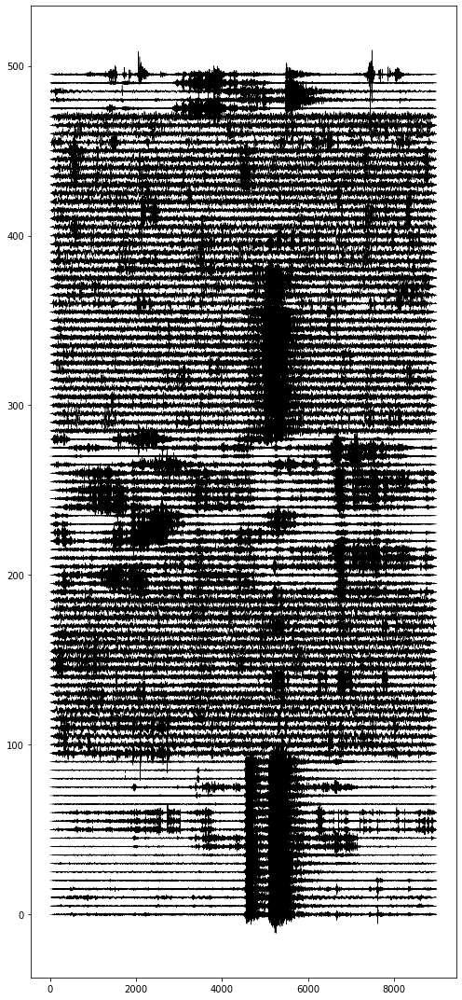

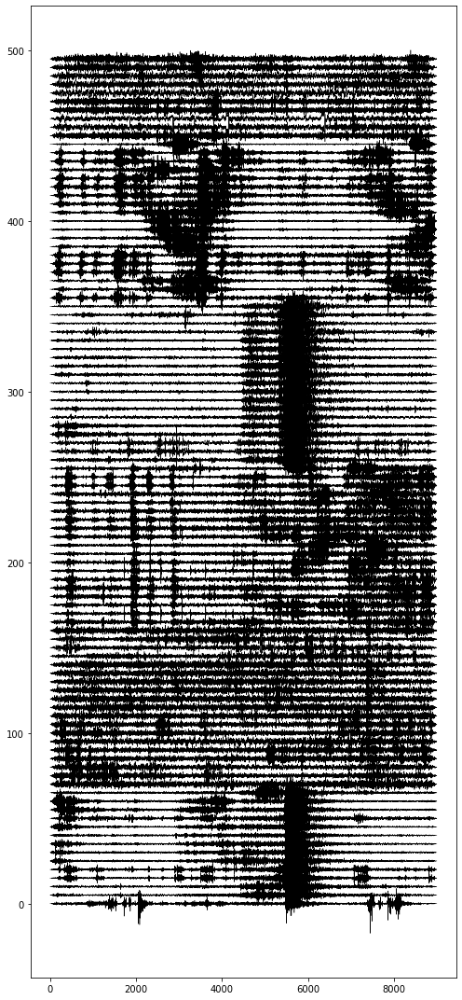

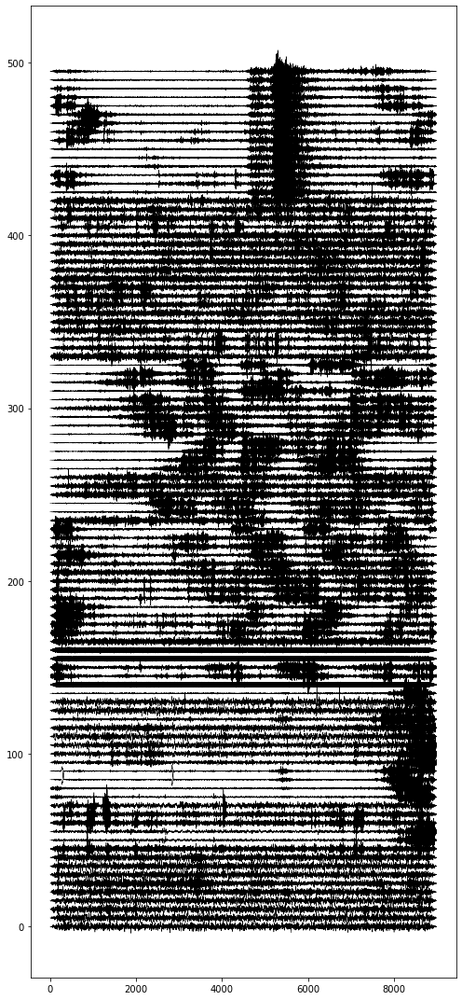

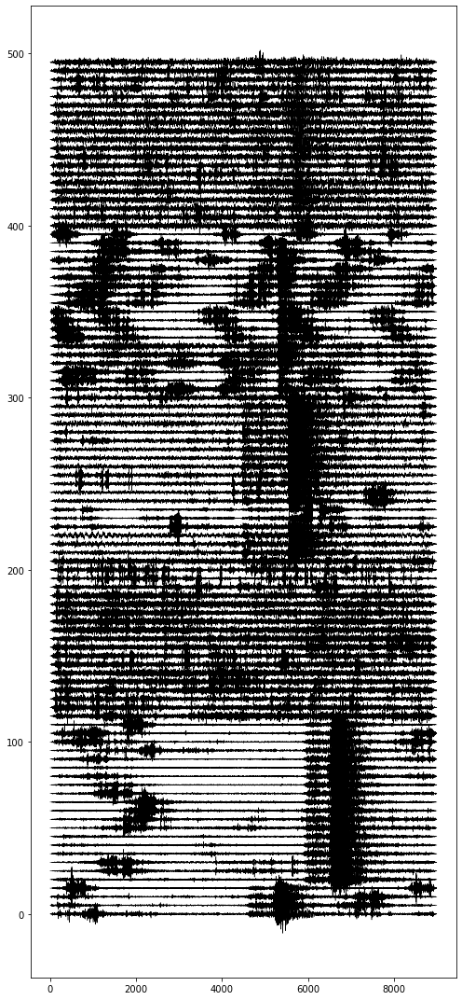

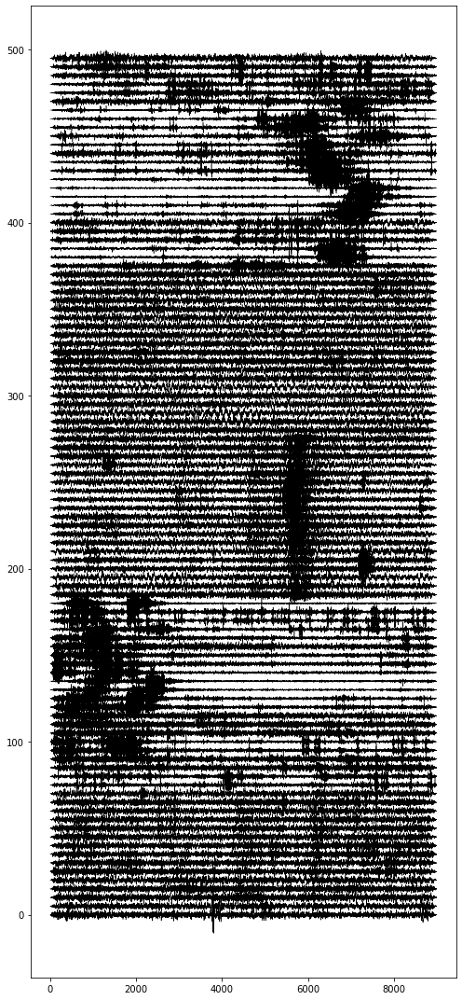

...

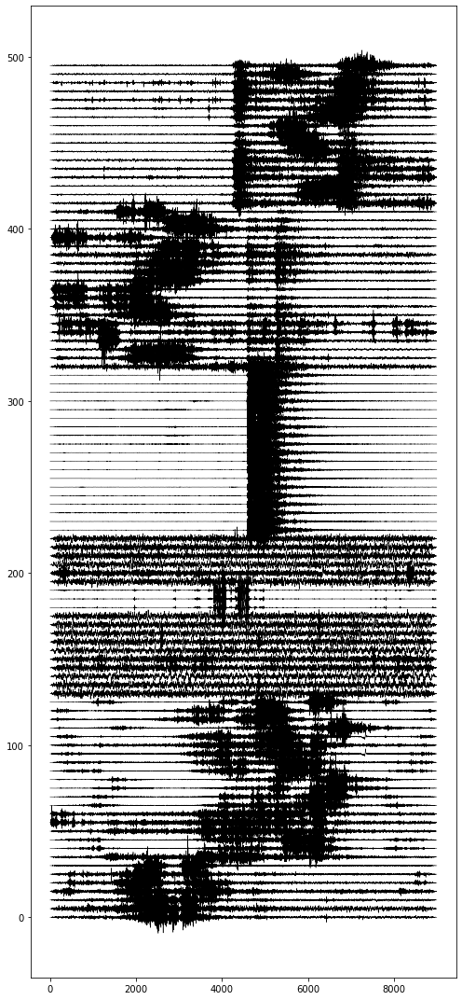

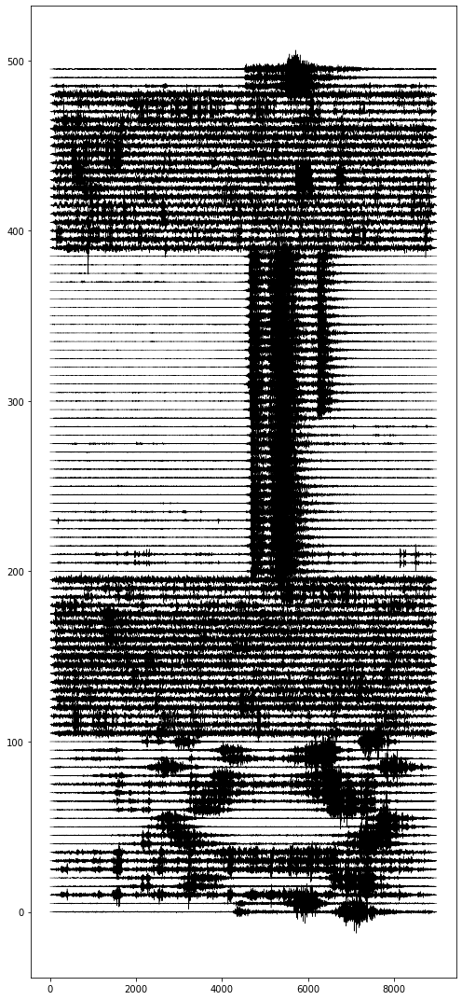

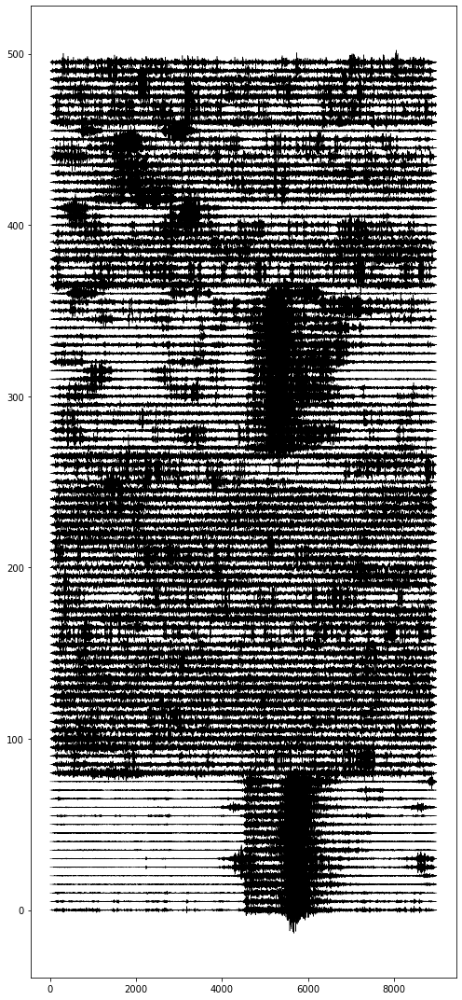

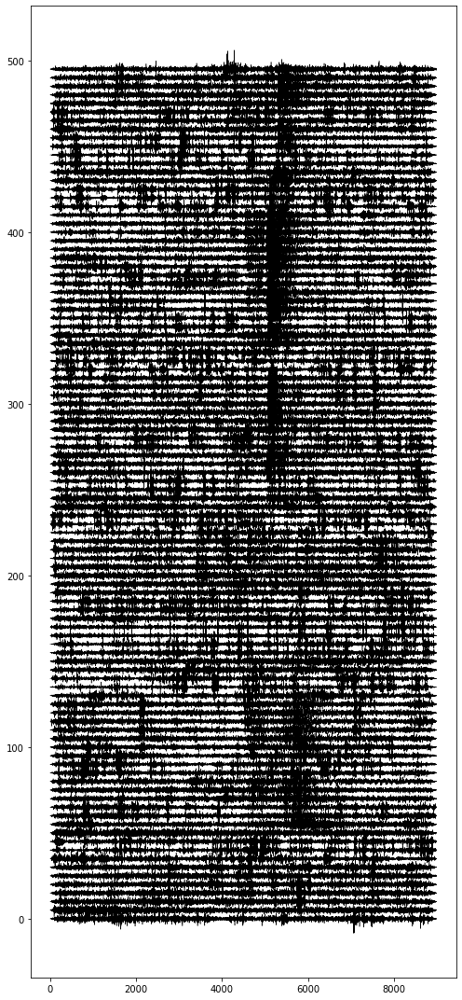

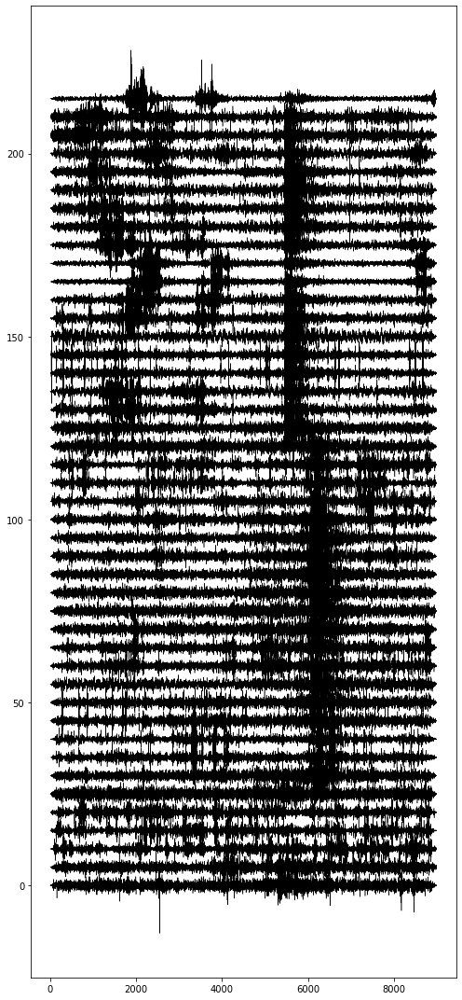

In [19]:
for j in range(15):
    plt.figure(figsize=(7, 15))
    for i in range(len(train_sr[j*100:j*100+100])):
        sr = train_sr[j*100 + i] / train_sr[j*100 + i].std()
        plt.plot(sr + 5*i, c="k", lw=0.5, alpha=1)
    plt.tight_layout()
    plt.show()

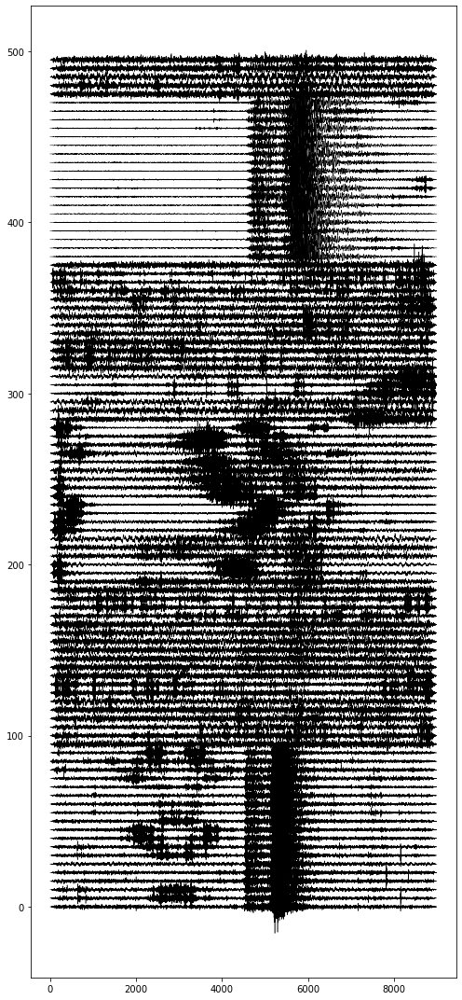

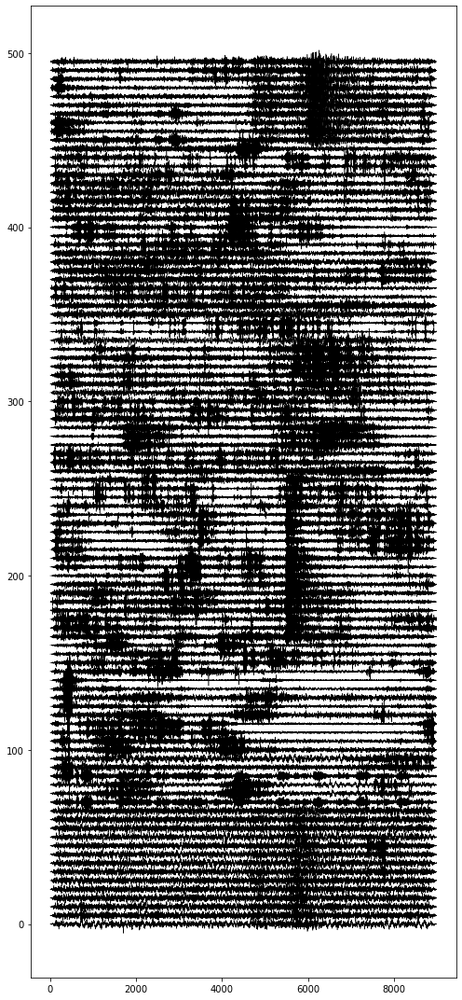

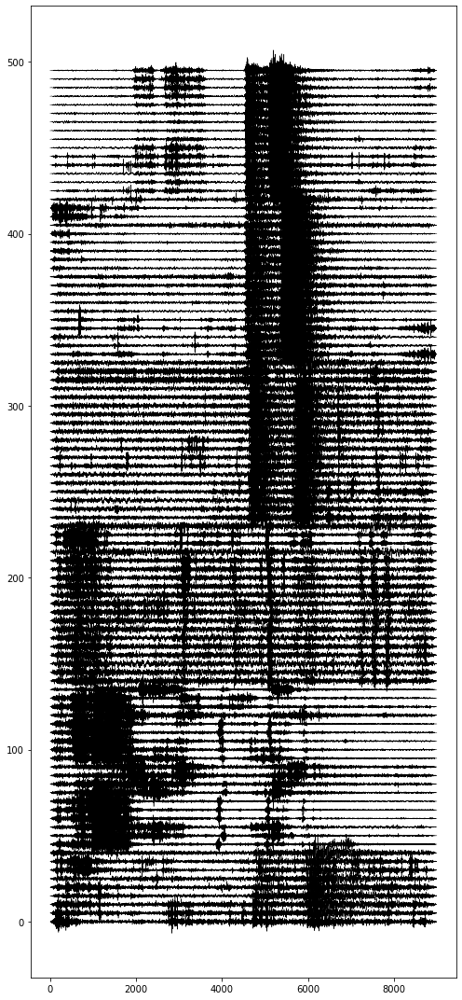

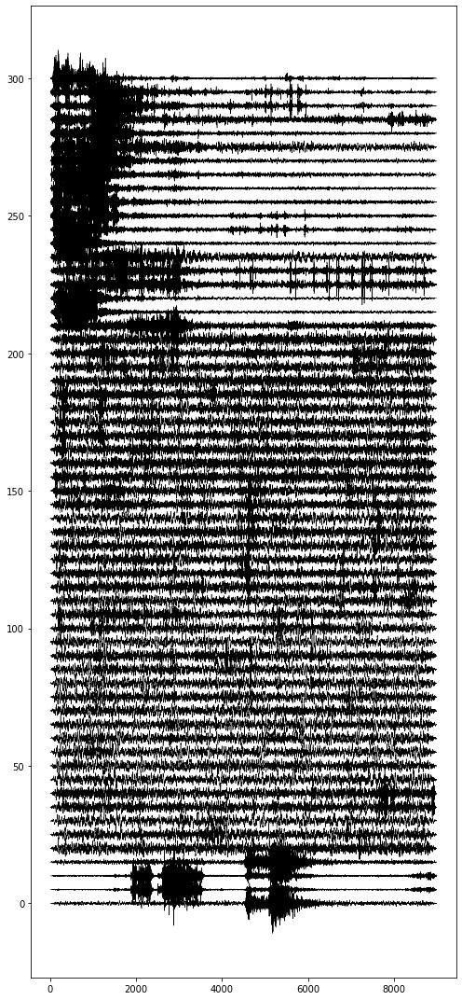

In [20]:
for j in range(4):
    plt.figure(figsize=(7, 15))
    for i in range(len(test_sr[j*100:j*100+100])):
        sr = test_sr[j*100 + i] / test_sr[j*100 + i].std()
        plt.plot(sr + 5*i, c="k", lw=0.5, alpha=1)
    plt.tight_layout()
    plt.show()

# Traffic Data

In [21]:
def speed2slowness(speed):
    speed = speed * 1000 / 3600 # km/h to m/s
    return 1/speed

def slowness2speed(slowness):
    speed = 1 / slowness
    return speed * 3600 / 1000

# shift = gauge * fs * slowness # L f / v
slowness = lambda shift, fs, gauge: shift / (gauge * fs) # s/m
speed = lambda shift, fs, gauge: (60 * 60 * gauge * fs) / (shift * 1000)

def observe_chunk(x, fs=250, gauge=4, v=500):

    shifts = []
    for i in range(1000):
        idx = np.random.choice(np.arange(len(x)), 2, replace=False)
        idx1 = np.min(idx)
        idx2 = np.max(idx)
        
        x1 = np.pad(x[idx1], (0,x.shape[1]-1))
        x2 = np.pad(x[idx2], (0,x.shape[1]-1))

        croco = np.fft.ifft(np.fft.fft(x1) * np.fft.fft(x2).conj()).real
        shift = np.argmax(croco)
        if shift > (x.shape[1] - 1):
            shift -= 2*x.shape[1] - 1
        shifts.append(shift / (idx2 - idx1))

    fig, ax = plt.subplots(1, 1, figsize=(8,6))
    extent = [0, x.shape[1], 0, x.shape[0]]
    im = ax.imshow(x, extent=extent, origin='lower',
                   interpolation='none', cmap='RdYlBu', aspect='auto',
                   vmin=-v, vmax=v)
    fig.colorbar(im, label='n$\epsilon$/s')
    ax.set_xlabel("Time [s]")
    ax.set_ylabel("Channel number")
    plt.show()
    shifts = np.array(shifts)
    plt.hist(shifts, bins=200)
    plt.show()
    print("{:.4f} km/h; {:.4f} s/m".format(speed(np.median(shifts), fs, gauge), slowness(np.median(shifts), fs, gauge)))
    
def plot_das(data, v=5):
    fig, ax = plt.subplots(1, 1, figsize=(12,6))
    extent = [0, data.shape[1], 0, data.shape[0]]
    im = ax.imshow(data, extent=extent, origin='lower',
                   interpolation='none', cmap='RdYlBu', aspect='auto',
                   vmin=-v, vmax=v)
    fig.colorbar(im, label='n$\epsilon$/s')
    ax.set_xlabel("Time [s]")
    ax.set_ylabel("Channel number")
    plt.show()

In [28]:
#
dir1 = '../../../../data/earthquakes/sissle/index0185_0205/'
dir2 = '../../../../data/earthquakes/sissle/index0275_0295/'
files1 = [f'{m//60:02d}{m%60:02d}01' for m in range(7*60+55,8*60+30)]
files2 = [f'{m//60:02d}{m%60:02d}01' for m in range(9*60+30,10*60)]

prefix = 'south30_250Hz_UTC_20230401_'
suffix = '.001.h5'

def get_chunk(idx, d, f):
    file = d + prefix + f[idx] + suffix
    data = (h5py.File(file,'r')['DAS'][:].T)[81:4978]
    file = d + prefix + f[idx+1] + suffix
    data = np.hstack([data, (h5py.File(file,'r')['DAS'][:].T)[81:4978]])
    file = d + prefix + f[idx+2] + suffix
    data = np.hstack([data, (h5py.File(file,'r')['DAS'][:].T)[81:4978]])
    return data

  0%|          | 0/12 [00:00<?, ?it/s]

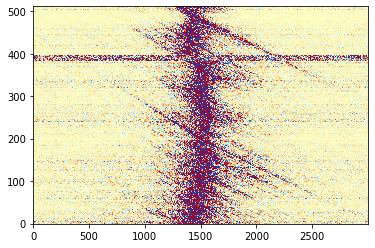

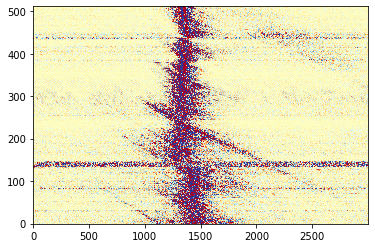

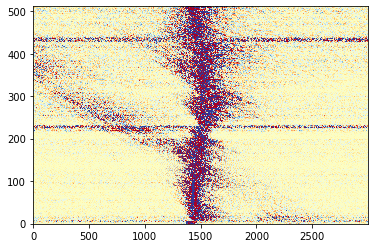

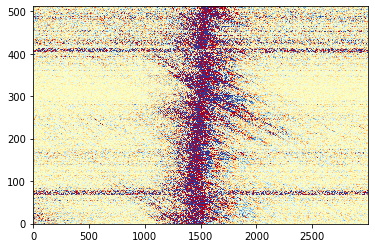

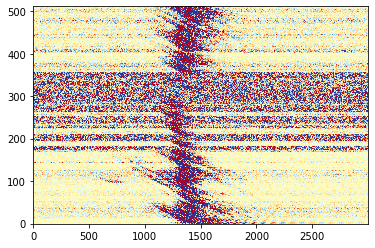

...

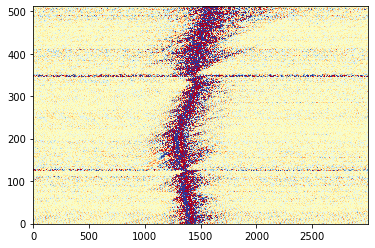

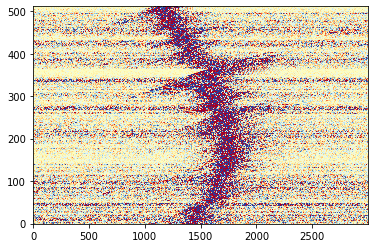

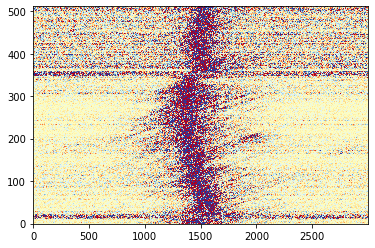

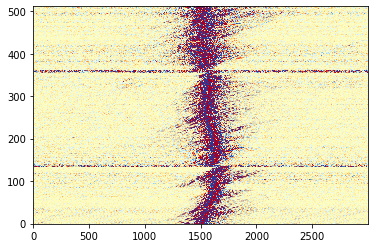

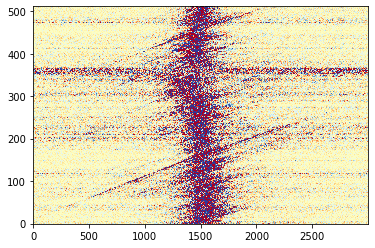

  0%|          | 0/8 [00:00<?, ?it/s]

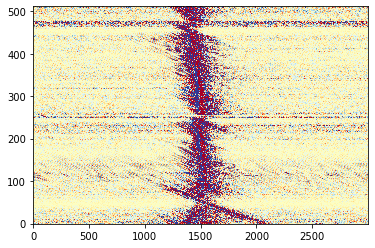

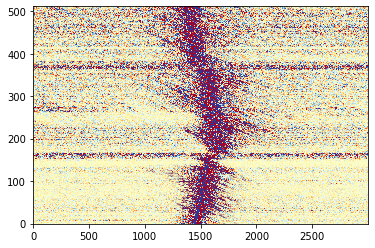

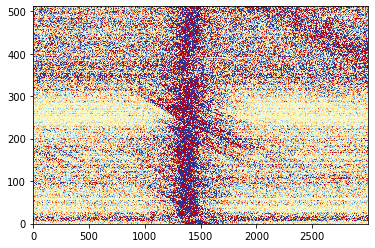

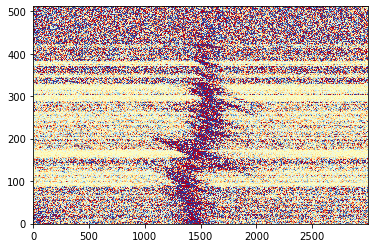

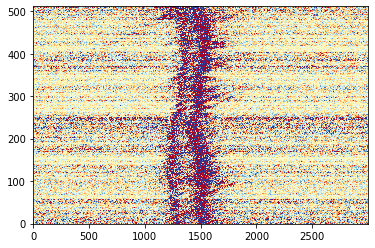

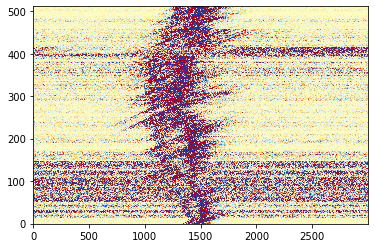

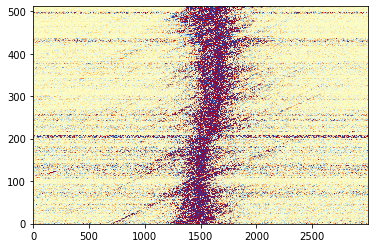

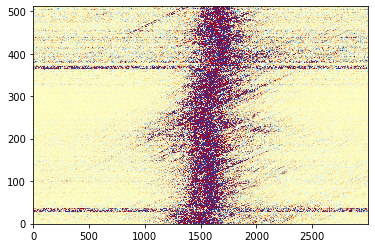

In [32]:
train_picks = [(2,190,16000,-0.034), (3,440,10000,-0.035), (4,870,10000,-0.033), (5,1230,7500,-0.03), (7,2230,10000,-0.039),
               (15,3050,37500,0.045), 
               (21,1320,37500,0.048), (23,750,35000,0.05),
               (23,1880,37500,0.057), (25,1285,37500,0.051), (27,740,37500,0.054), (29,220,35000,0.052),
              ]
test_picks = [(1,625,7500,-0.047), (2,935,7500,-0.04), (3,1290,7500,-0.037), (5,2070,7500,-0.048), 
              (5,4000,32500,0.042), (10,2440,35000,0.048), (12,1720,35000,0.040), (13,1270,37500,0.040), 
             ]

for n, p in enumerate(tqdm(train_picks)):
    chunk_idx, i, j, sl = p
    shift = 4.08 * 250 * sl
    data = get_chunk(chunk_idx, dir1, files1)
    st = []
    for c in range(512):
        jj = j - int(c*shift)
        sr = data[i+c, jj-30*250:jj+30*250]
        st += [obspy.Trace(data=sr, header={'npts': len(sr), 'sampling_rate': 250})]
       
    st = obspy.Stream(traces=st)
    
    st.decimate(5, no_filter=False)
    strain_rates = np.stack([tr.data for tr in st])
    
    d = 'inc' if sl < 0 else 'dec'
    np.save('./../Data/synthetic-DAS/traffic_strain_rates/train_50Hz_{:02d}_{}.npy'.format(n, d), strain_rates)
    
    plt.imshow(strain_rates / strain_rates.std(axis=-1)[:,None], origin='lower',
                       interpolation='none', cmap='RdYlBu', aspect='auto', vmin=-1, vmax=1)
    plt.show()
    
for n, p in enumerate(tqdm(test_picks)):
    chunk_idx, i, j, sl = p
    shift = 4.08 * 250 * sl
    data = get_chunk(chunk_idx, dir1, files1)
    st = []
    for c in range(512):
        jj = j - int(c*shift)
        sr = data[i+c, jj-30*250:jj+30*250]
        st += [obspy.Trace(data=sr, header={'npts': len(sr), 'sampling_rate': 250})]
       
    st = obspy.Stream(traces=st)
    
    st.decimate(5, no_filter=False)
    strain_rates = np.stack([tr.data for tr in st])
    
    d = 'inc' if sl < 0 else 'dec'
    np.save('./../Data/synthetic-DAS/traffic_strain_rates/test_50Hz_{:02d}_{}.npy'.format(n, d), strain_rates)
    
    plt.imshow(strain_rates / strain_rates.std(axis=-1)[:,None], origin='lower',
                       interpolation='none', cmap='RdYlBu', aspect='auto', vmin=-1, vmax=1)
    plt.show()

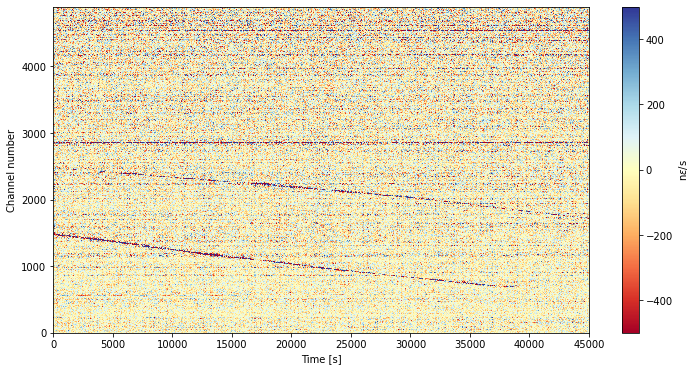

In [30]:
d = get_chunk(23, dir1, files1)
plot_das(d, v=500)

# Synthetic DAS

In [34]:
eq_train = torch.from_numpy(np.load('./../Data/synthetic-DAS/SIS-rotated_train_50Hz.npy'))
traffic_inc_train = torch.from_numpy(np.stack([np.load('./../Data/synthetic-DAS/traffic_strain_rates/train_50Hz_{:02d}_inc.npy'.format(i)) for i in range(5)]))
traffic_dec_train = torch.from_numpy(np.stack([np.load('./../Data/synthetic-DAS/traffic_strain_rates/train_50Hz_{:02d}_dec.npy'.format(i)) for i in range(5,12)]))

eq_test = torch.from_numpy(np.load('./../Data/synthetic-DAS/SIS-rotated_test_50Hz.npy'))
traffic_inc_test = torch.from_numpy(np.stack([np.load('./../Data/synthetic-DAS/traffic_strain_rates/test_50Hz_{:02d}_inc.npy'.format(i)) for i in range(4)]))
traffic_dec_test = torch.from_numpy(np.stack([np.load('./../Data/synthetic-DAS/traffic_strain_rates/test_50Hz_{:02d}_dec.npy'.format(i)) for i in range(4,8)]))

In [35]:
np.random.randn(1)

array([0.86560189])

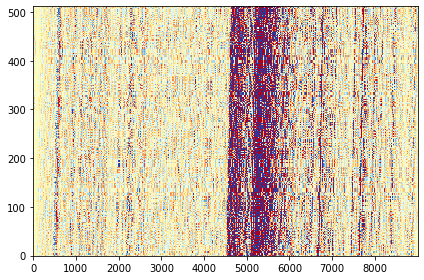

In [38]:
sample = udata.generate_synthetic_das(eq_train[0], 4, 10.0, 5e-3, nx=512)
fig, ax = plt.subplots(1, 1, sharex=True, figsize=(6,4))
ax.imshow((sample / sample.std(dim=-1, keepdim=True)).detach().cpu().numpy(), origin='lower', interpolation='nearest', cmap='RdYlBu', aspect='auto', vmin=-1, vmax=1)
plt.tight_layout()
plt.show()

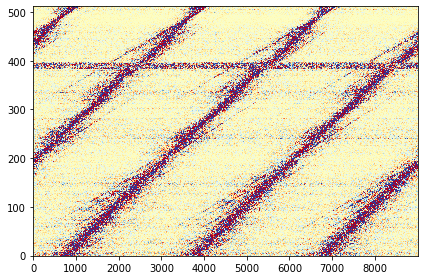

In [39]:
sample = udata.shift_traffic_rates(torch.flip(traffic_inc_train[0], dims=(1,)), 4, 50.0, 0.06)
fig, ax = plt.subplots(1, 1, sharex=True, figsize=(6,4))
ax.imshow((sample / sample.std(dim=-1, keepdim=True)).detach().cpu().numpy(), origin='lower', interpolation='nearest', cmap='RdYlBu', aspect='auto', vmin=-1, vmax=1)
#plt.savefig('out/figures/synthetic-traffic.pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

In [44]:
trainset = udata.SyntheticTrafficDAS(eq_train, 
                                   traffic_inc_train, traffic_dec_train,
                                   nt=512, eq_slowness=(1e-4, 5e-3), traffic_slowness=(3e-2, 6e-2),
                                   gauge=4, fs=50.0, size=1000)
testset = udata.SyntheticTrafficDAS(eq_test, 
                                  traffic_inc_test, traffic_dec_test,
                                  nt=512, eq_slowness=(1e-4, 5e-3), traffic_slowness=(3e-2, 6e-2),
                                  gauge=4, fs=50.0, size=1000)

batch_size = 8
dloader = {'train': DataLoader(trainset, batch_size=batch_size, shuffle=True), 
           'test': DataLoader(testset, batch_size=batch_size, shuffle=False)}

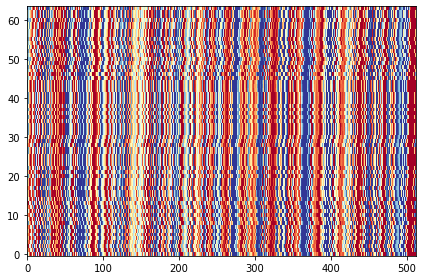

0.19428697228431702

In [63]:
start = time.perf_counter()

sample, eq_das, traffic_das, scale, amp = next(iter(dloader['train']))
fig, ax = plt.subplots(1, 1, sharex=True, figsize=(6,4))
ax.imshow(sample[0,0].detach().cpu().numpy(), origin='lower', interpolation='nearest', cmap='RdYlBu', aspect='auto', vmin=-1, vmax=1)
plt.tight_layout()
plt.show()

time.perf_counter() - start

In [62]:
print(sample[0,0].shape)
print(eq_das.shape)
print(traffic_das.shape)

torch.Size([64, 512])
torch.Size([8, 1, 64, 512])
torch.Size([8, 1, 64, 512])
